In [38]:
import torch
import numpy as np
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torchvision.transforms import Compose, Resize, ToTensor, Normalize

from utils.config import load_config
from utils.notebook import display_batch, imshow, image_from_tensor
from utils.masking import mask_batch
from ml.UNet import UNet
from ml.SimpleGenerator import SimpleGenerator
from ml.DeepFill import DeepFill

In [39]:
config = load_config("../config.toml")
image_size = config["files"]["image_size"]
batch_size = config["train"]["batch_size"]
workers = config["train"]["workers"]
MODEL_DIR = "../models"


dataroot = "../images"

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [40]:
config = load_config("../config_deepfill.toml")
image_size = config["files"]["image_size"]
batch_size = config["train"]["batch_size"]
workers = config["train"]["workers"]
MODEL_DIR = "../models"


dataroot = "../images/train/" #TODO: change to test

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [41]:
dataset = ImageFolder(root=dataroot, transform=Compose([
    Resize((image_size, image_size)),
    ToTensor(),
    Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
]))

dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=workers)

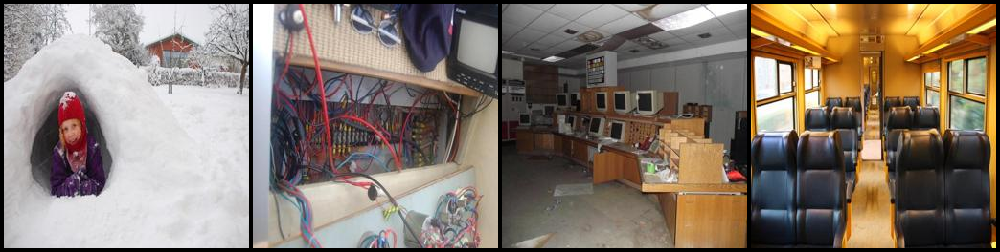

In [47]:
dl_iter = iter(dataloader)
real_batch = next(dl_iter)
display_batch(real_batch)

In [21]:
def load_generator(checkpoint_path, model, device, **kwargs):
    G_weights = torch.load(f"{MODEL_DIR}/{checkpoint_path}")
    netG = model(device, **kwargs)
    netG.load_state_dict(G_weights)
    netG.to(device)
    return netG

In [32]:
def eval_generator(checkpoint_path, model, test_batch, device, **kwargs):
    test_mask = mask_batch(test_batch, device=device).to(device)
    netG = load_generator(checkpoint_path, model, device, **kwargs)
    with torch.no_grad():
        res = netG(test_mask)
        if len(res) == 2 and isinstance(res, tuple):
            res = res[1]
        for i in range(batch_size):
            img = test_mask[i][:3, ...]
            imshow(np.concatenate([image_from_tensor(img), image_from_tensor(res[i])], axis=1))

In [9]:
D_CKPT = "checkpoints/best_discriminator_20260126_012907.pth"
G_CKPT = "checkpoints/best_generator_20260126_012907.pth"

In [10]:
test_batch = next(dl_iter)

eval_generator(G_CKPT, UNet, test_batch[0], device)

RuntimeError: Expected all tensors to be on the same device, but got tensors is on cuda:0, different from other tensors on cpu (when checking argument in method wrapper_CUDA_cat)

In [23]:
test_batch = next(dl_iter)
eval_generator("checkpoints/generator_20260119_161009_iter50.pth", UNet, test_batch[0], device)

FileNotFoundError: [Errno 2] No such file or directory: '../models/checkpoints/generator_20260119_161009_iter50.pth'

## Best

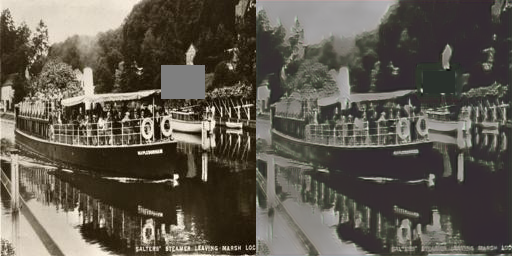

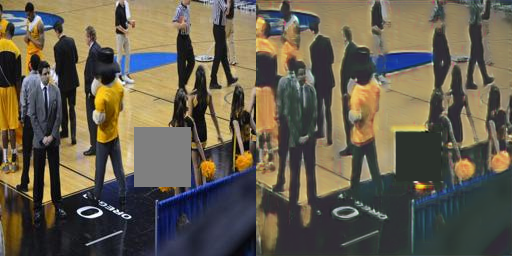

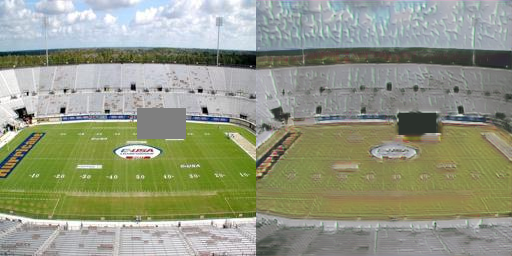

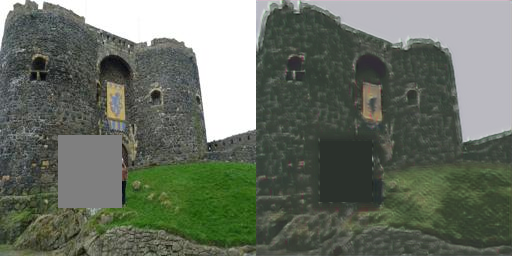

In [ ]:
BEST_G_CKPT = "generator_best.pth"

test_batch = next(dl_iter)
eval_generator(BEST_G_CKPT, SimpleGenerator, test_batch[0], device)

## DeepFill

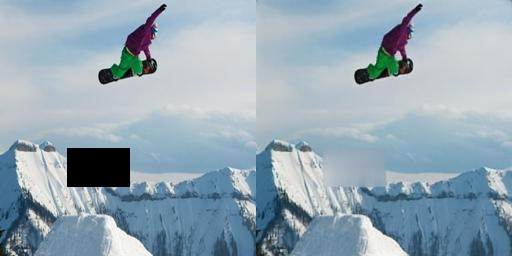

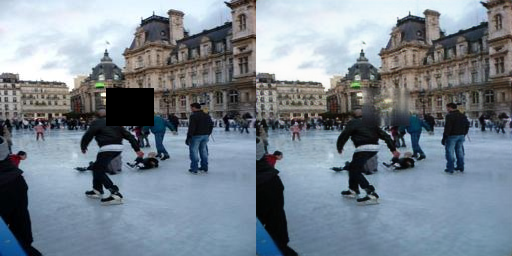

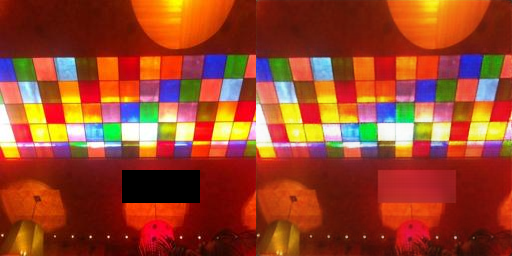

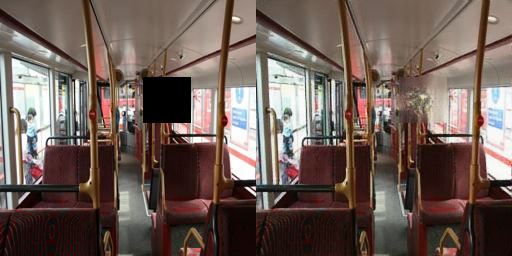

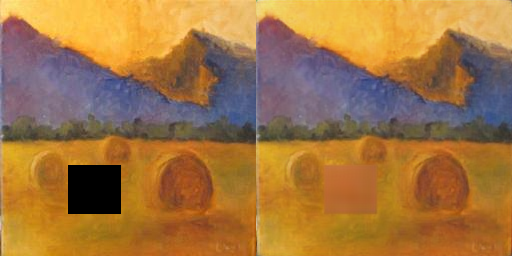

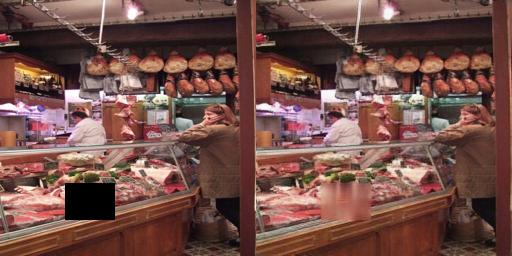

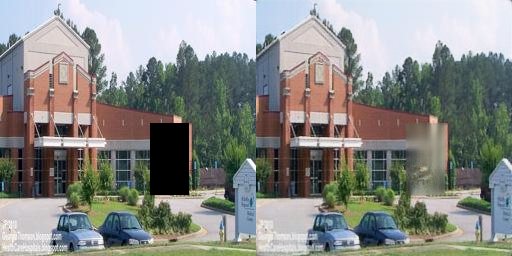

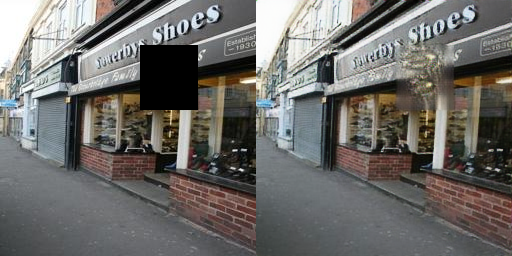

In [33]:
test_batch = next(dl_iter)[0].to(device)
eval_generator("generator_20260127_050942.pth", DeepFill, test_batch, device, cnum=32)

In [36]:
from ml.PatchGAN import PatchGANDiscriminator

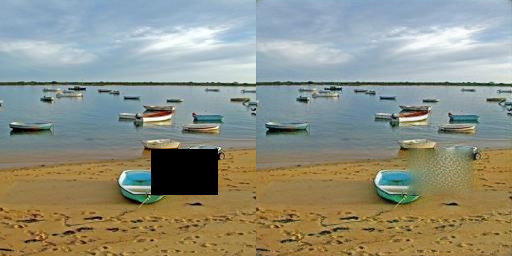

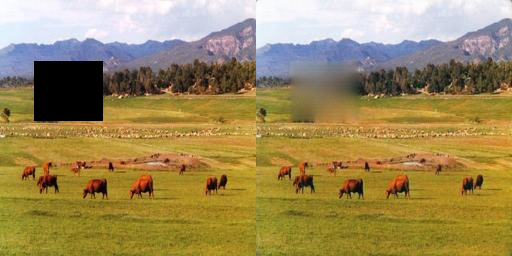

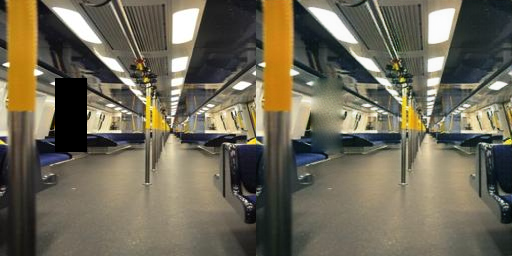

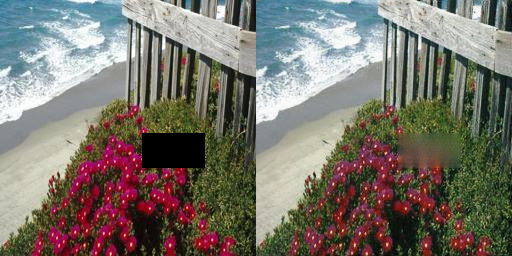

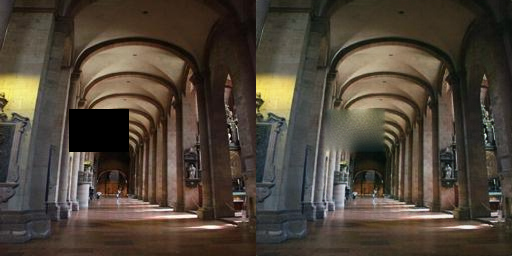

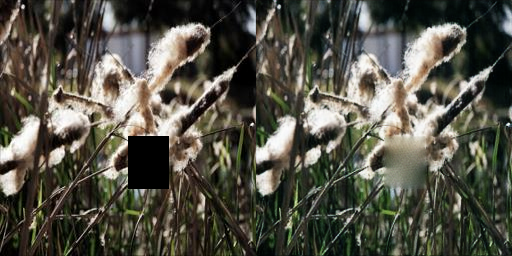

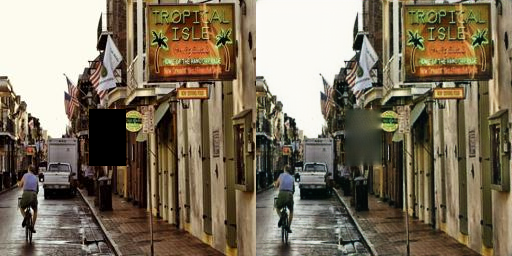

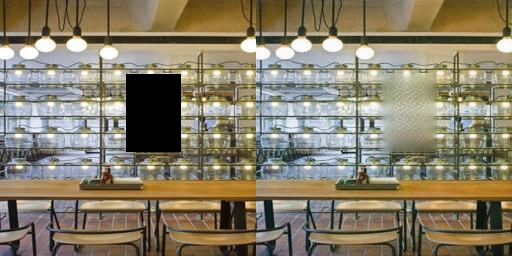

In [37]:
test_batch = next(dl_iter)[0].to(device)
eval_generator("generator_20260127_063426.pth", DeepFill, test_batch, device, cnum=32)

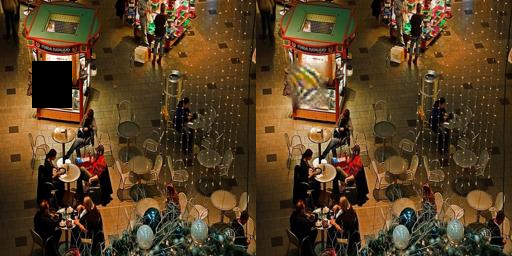

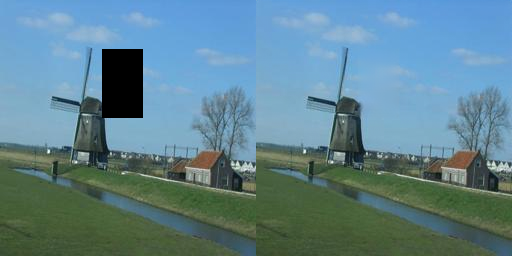

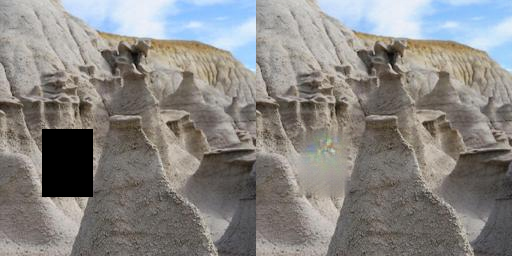

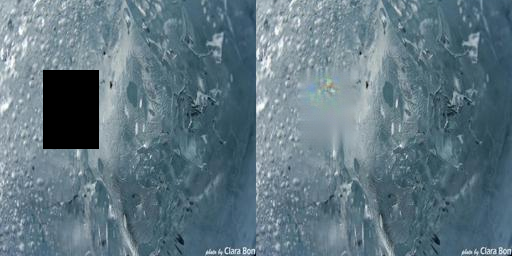

In [43]:
test_batch = next(dl_iter)[0].to(device)
eval_generator("generator_20260127_070530.pth", DeepFill, test_batch, device, cnum=32)

In [50]:
from torchvision.utils import make_grid

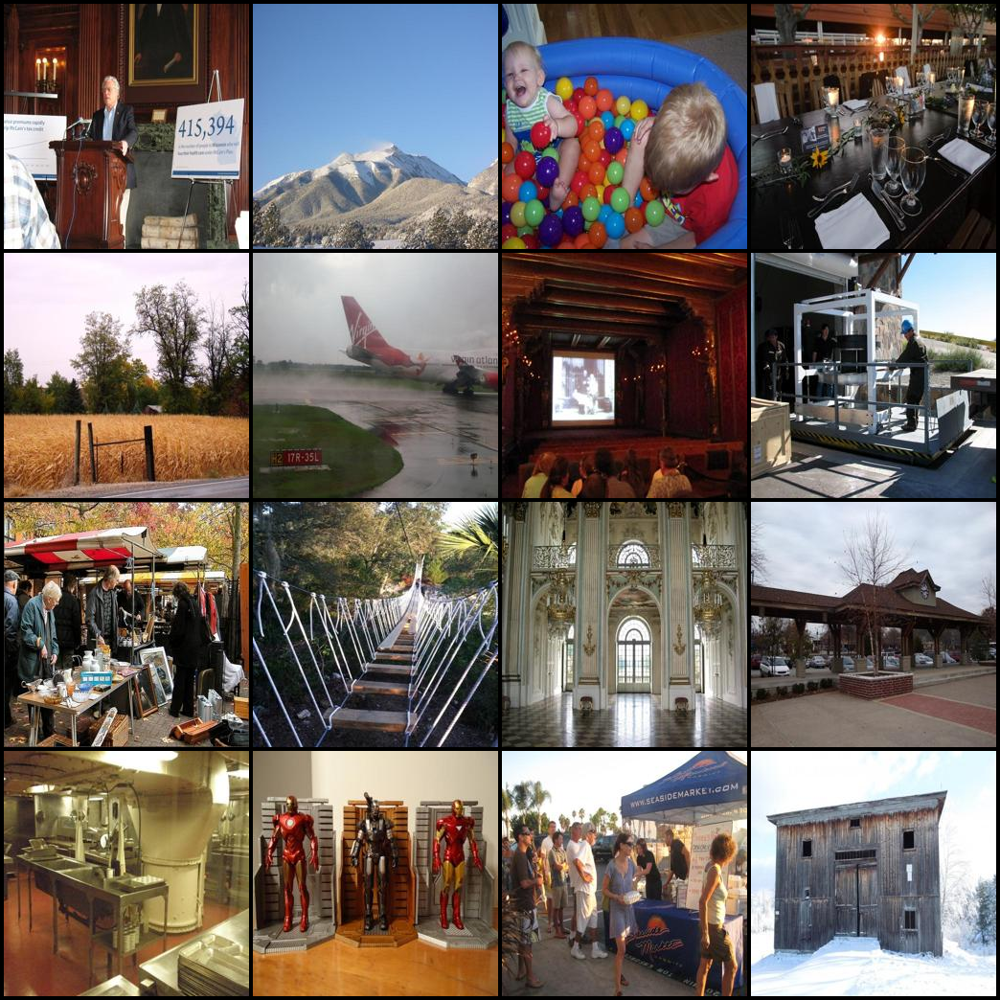

In [51]:
dataloader2 = DataLoader(dataset, batch_size=16, shuffle=True, num_workers=workers)
dl_iter2 = iter(dataloader2)
test_batch = next(dl_iter2)[0]
grid = make_grid(test_batch, padding=4, normalize=True, nrow=4)
imshow(image_from_tensor(grid))

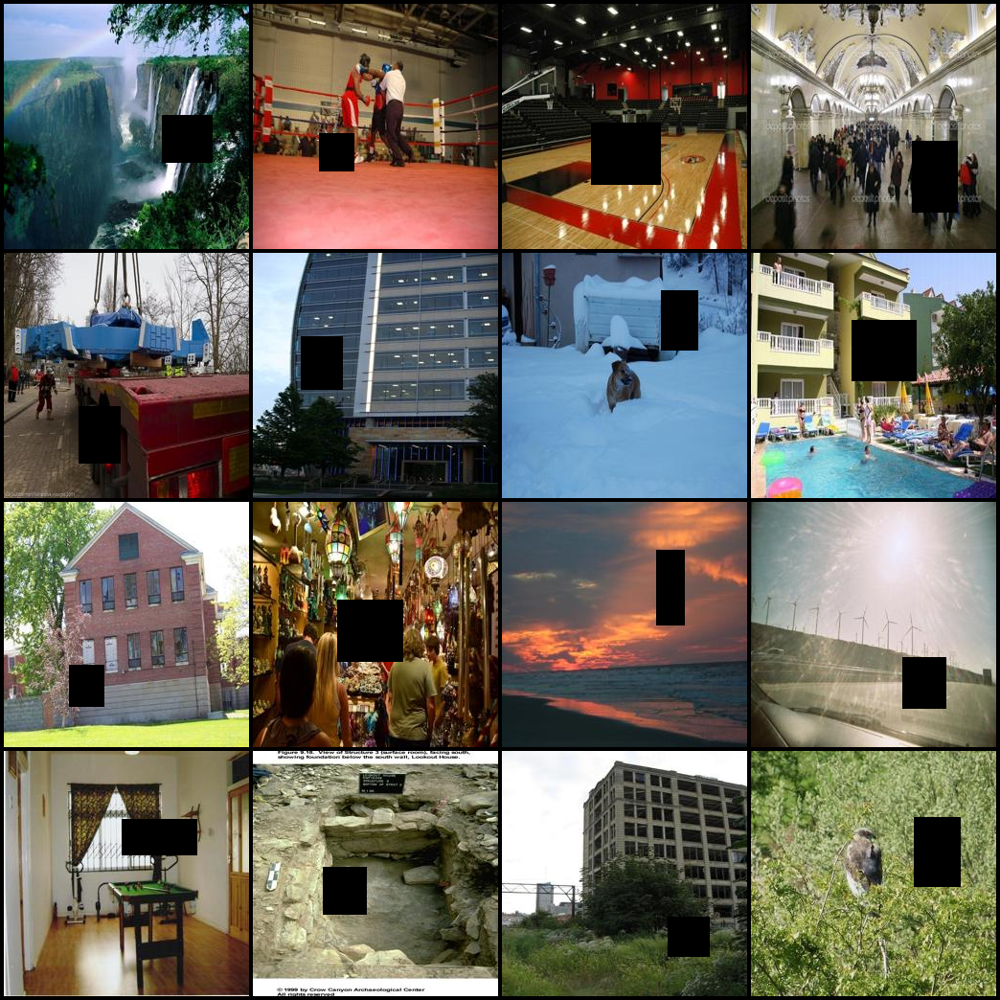

In [63]:
dataloader2 = DataLoader(dataset, batch_size=16, shuffle=True, num_workers=workers)
dl_iter2 = iter(dataloader2)
test_batch = next(dl_iter2)[0].to(device)
test_batch = mask_batch(test_batch, device=device)[:, :3, ...]
grid = make_grid(test_batch, padding=4, normalize=True, nrow=4)
imshow(image_from_tensor(grid))

In [66]:
DeepFill(device, cnum=32).summary()

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 256, 256]           3,232
            Conv2d-2         [-1, 32, 256, 256]           3,232
           Sigmoid-3         [-1, 32, 256, 256]               0
         GatedConv-4         [-1, 32, 256, 256]               0
               ELU-5         [-1, 32, 256, 256]               0
            Conv2d-6         [-1, 64, 128, 128]          18,496
            Conv2d-7         [-1, 64, 128, 128]          18,496
           Sigmoid-8         [-1, 64, 128, 128]               0
         GatedConv-9         [-1, 64, 128, 128]               0
              ELU-10         [-1, 64, 128, 128]               0
           Conv2d-11         [-1, 64, 128, 128]          36,928
           Conv2d-12         [-1, 64, 128, 128]          36,928
          Sigmoid-13         [-1, 64, 128, 128]               0
        GatedConv-14         [-1, 64, 1

In [67]:
UNet(device).summary()

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           2,304
       BatchNorm2d-2         [-1, 64, 256, 256]             128
              ReLU-3         [-1, 64, 256, 256]               0
            Conv2d-4         [-1, 64, 256, 256]          36,864
       BatchNorm2d-5         [-1, 64, 256, 256]             128
              ReLU-6         [-1, 64, 256, 256]               0
         ConvBlock-7         [-1, 64, 256, 256]               0
         MaxPool2d-8         [-1, 64, 128, 128]               0
            Conv2d-9        [-1, 128, 128, 128]          73,728
      BatchNorm2d-10        [-1, 128, 128, 128]             256
             ReLU-11        [-1, 128, 128, 128]               0
           Conv2d-12        [-1, 128, 128, 128]         147,456
      BatchNorm2d-13        [-1, 128, 128, 128]             256
             ReLU-14        [-1, 128, 1